In [1]:
import healpy as h
from scipy.integrate import quad
import os
import sys  ; sys.path.append("../../codes/")
from modules import local_eb_kernel as rk

import timeit

%pylab notebook

cmap=cm.jet ; cmap.set_over(cmap(1.0)); cmap.set_under('w') ; cmap.set_bad('gray')

Populating the interactive namespace from numpy and matplotlib


In [2]:
from matplotlib import rcParams,rc
params = {'backend': 'pdf',
          'savefig.dpi': 200,
          'axes.labelsize': 15,
          'text.fontsize': 15,
          'axes.linewidth' : 2,
          'lines.linewidth' : 2,
          'font.size': 15,
          'xtick.labelsize': 15,
          'ytick.major.pad': 6,
          'xtick.major.pad': 6,
          'ytick.labelsize': 15,
          'text.usetex': True,
          'font.family':'sans-serif',
          'font.sans-serif':'FreeSans'}
rc('text.latex', preamble='\usepackage{sfmath}')
rcParams.update(params)

/Users/adityarotti/Library/Enthought/Canopy/edm/envs/User/lib/python2.7/site-packages/matplotlib/__init__.py:913: UserWarning: text.fontsize is deprecated and replaced with font.size; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))


In [63]:
nside=128 ; upnside=nside ; npix=h.nside2npix(upnside)
lmax=2*nside ; lmin=50 ; suffix1="_lmin" + str(lmin) + "_lmax" + str(lmax) + "_nside"+str(nside)
ell=linspace(0,3*nside,3*nside+1)

odisc=ceil(min(180.,180.*(32./lmax)))
odisc=15.
print (odisc)

figpath="../../figures/353ghz/"
datapath="../../figures/353ghz/generated_data/"

dataext=".fits" ; figext=".pdf"

15.0


In [64]:
tqu=h.read_map("../../data/planck353full_TQU_map_nside512.fits",(0,1,2))
tqu=h.ud_grade(tqu,nside)

# Get teb maps from Healpix.
alm=h.map2alm(tqu,lmax=3*nside,pol=True) ; teb=h.alm2map(alm,upnside,pol=False,verbose=False)

# Get data power spectrum.
cld=h.alm2cl(alm)

# Get Q/U corresponding to E and B modes.
alm[2][:]=0.0 ; equ=h.alm2map(alm,nside=nside,pol=True,verbose=False)
alm=h.map2alm(tqu,lmax=3*nside,pol=True) ; alm[1][:]=0.0 ; bqu=h.alm2map(alm,nside=nside,pol=True,verbose=False)

NSIDE = 512
ORDERING = RING in fits file
INDXSCHM = IMPLICIT


<IPython.core.display.Javascript object>


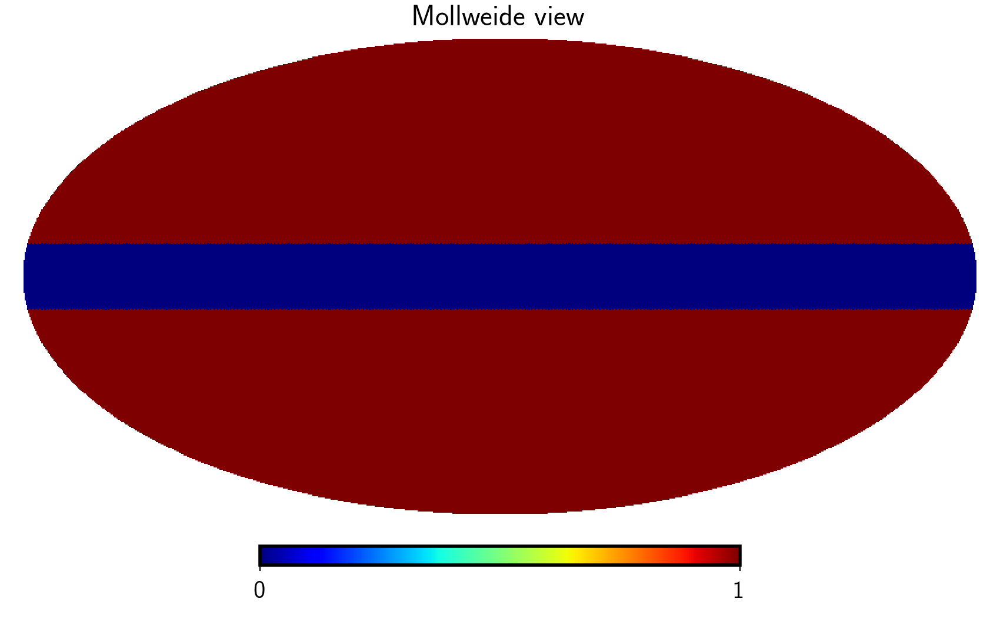

In [65]:
npix=h.nside2npix(nside)
pix=arange(npix)
theta=h.pix2ang(nside,pix)[0]
mask=zeros(npix,float) ; bwidth=10
mask[(theta*180./pi)<90-bwidth]=1 ; mask[(theta*180./pi)>90+bwidth]=1
h.mollview(mask)

In [66]:
alm=h.map2alm(tqu,lmax=3*nside,pol=True)
fl=ones(3*nside+1,float) ; fl[:lmin+1]=0 ; fl[lmax+1:]=0
h.almxfl(alm[1],fl,inplace=True) ; h.almxfl(alm[2],fl,inplace=True)

tebp=h.alm2map(alm,nside=nside,pol=False)
filename=datapath + "filtered_teb"+suffix1+".fits" ; h.write_map(filename,tebp,overwrite=True)

equp=h.alm2map([alm[0],alm[1],alm[2]*0.],nside=nside,pol=True)
filename=datapath + "filtered_equ"+suffix1+".fits" ; h.write_map(filename,equp,overwrite=True)

bqup=h.alm2map([alm[0],alm[1]*0.,alm[2]],nside=nside,pol=True)
filename=datapath + "filtered_bqu"+suffix1+".fits" ; h.write_map(filename,bqup,overwrite=True)

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin
Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


# Evaluating the real space convolutions

In [67]:
dsize=15. ; apo=4.
suffix="_disc" + str(int(dsize)) + "d_apo" + str(int(apo)) + "d" + suffix1
print suffix + dataext

filenames=[]
filenames=append(filenames,datapath + "real_space_filtered_teb" + suffix + dataext)
filenames=append(filenames,datapath + "real_space_filtered_equ" + suffix + dataext)
filenames=append(filenames,datapath + "real_space_filtered_bqu" + suffix + dataext)

fexist=True
for f in filenames:
    fexist=fexist and os.path.isfile(f)
fexist

_disc15d_apo4d_lmin50_lmax256_nside128.fits


False

In [68]:
# Precompute the radial part of the kernel.

if not(fexist):
    y=rk.real_space_queb_kernels(nside,tmax=2.2*odisc,maxlmax=3*nside,sampling=2500)
    y.calc_qu2eb_rad_kernel(lmax,lmin)
    y.calc_qu2queb_rad_kernel(lmax,lmin)
    y.setup_taper(dsize,apo) ; y.setup_fn_rad_ker()

In [69]:
if fexist:
    rteb=h.read_map(filenames[0],(0,1,2),verbose=False)
    equ=h.read_map(filenames[1],(0,1,2),verbose=False)
    bqu=h.read_map(filenames[2],(0,1,2),verbose=False)
else:
    rteb=y.convert_qu2eb(tqu,discsize=dsize)
    requ,rbqu=y.decompose_qu2_equ_bqu(tqu,discsize=dsize)

    filename=datapath + "real_space_filtered_teb" + suffix + dataext
    h.write_map(filename,rteb)

    filename=datapath + "real_space_filtered_equ" + suffix + dataext
    h.write_map(filename,requ)

    filename=datapath + "real_space_filtered_bqu" + suffix + dataext
    h.write_map(filename,rbqu)

<IPython.core.display.Javascript object>


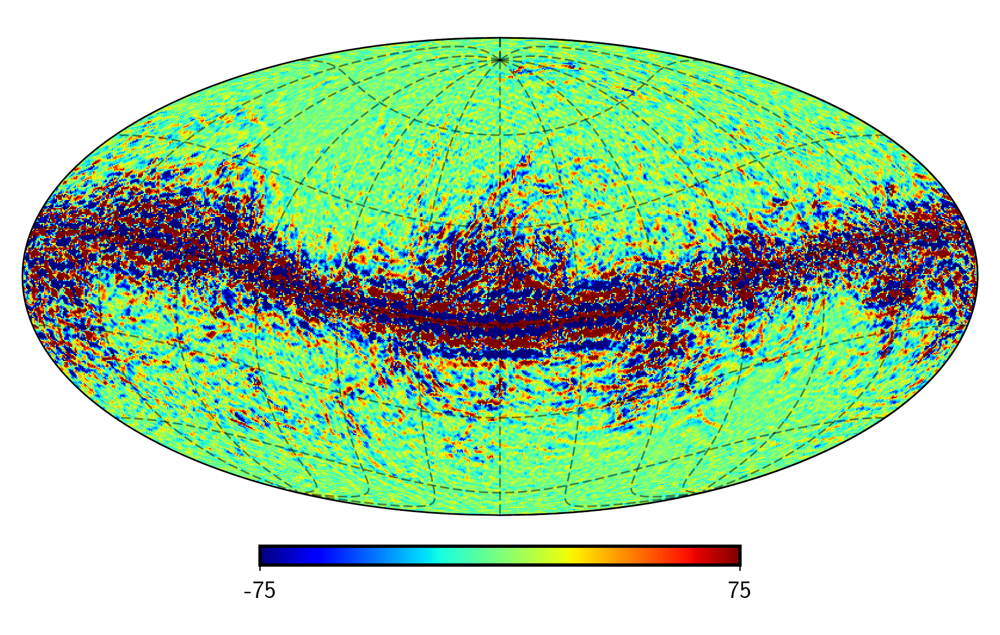

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


<IPython.core.display.Javascript object>


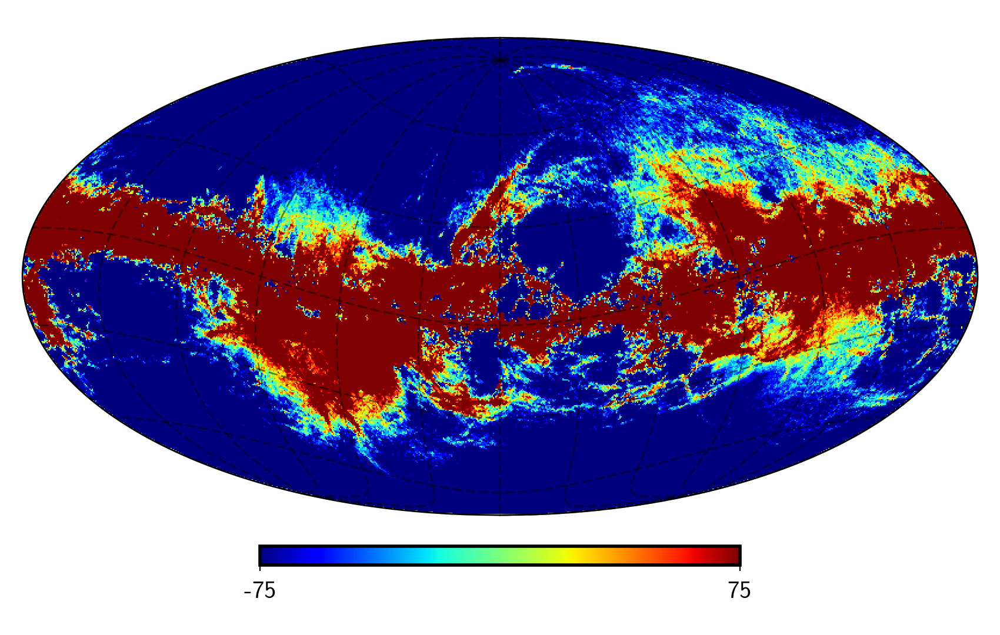

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


<IPython.core.display.Javascript object>


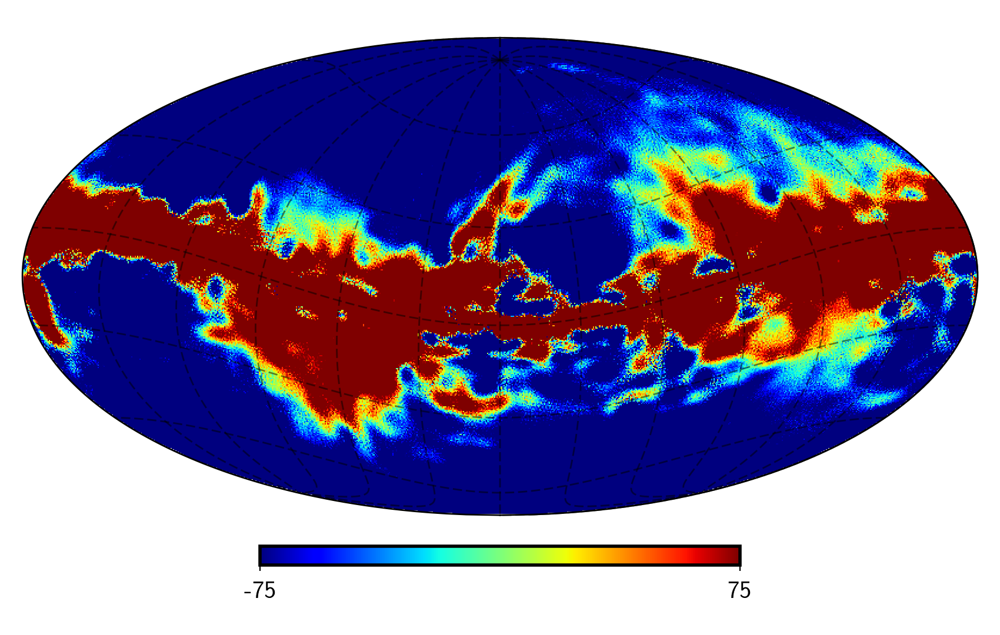

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


<IPython.core.display.Javascript object>


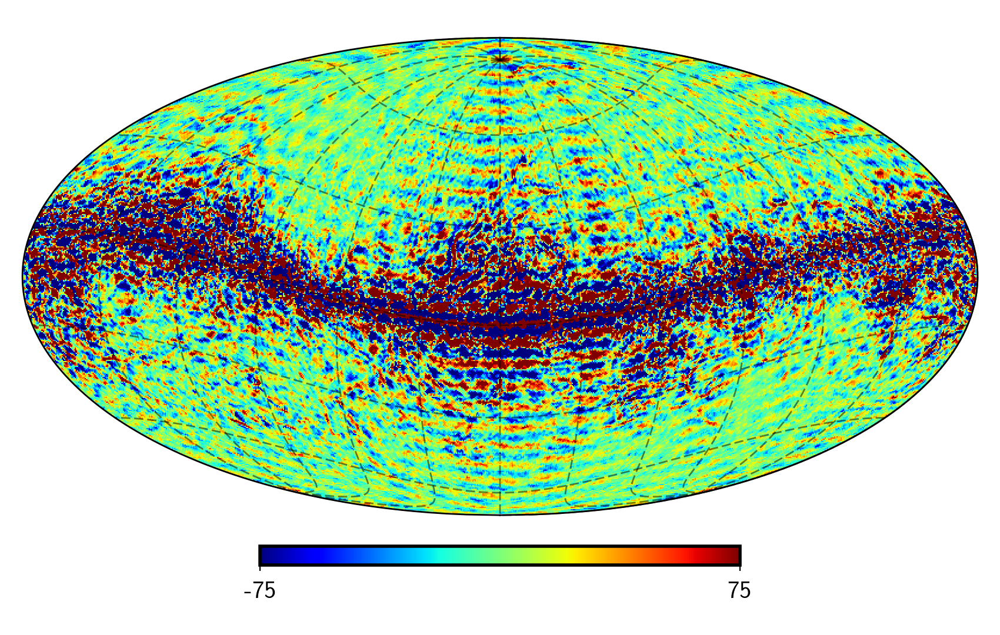

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


In [70]:
vmin=-75 ; vmax=75
h.mollview(rteb[1],rot=(0,15),min=vmin,max=vmax,title="",cmap=cmap)
h.graticule(linestyle="dashed",alpha=0.5)
filename="353ghz-e-mode-realspace" + suffix + figext
savefig(figpath+filename,dpi=300,bbox_inches="tight")
filename="353ghz-e-mode-realspace" + suffix + ".jpg"
savefig(figpath+filename,dpi=300,bbox_inches="tight")

h.mollview(teb[1],rot=(0,15),min=vmin,max=vmax,title="",cmap=cmap)
h.graticule(linestyle="dashed",alpha=0.5)
filename="353ghz-e-mode-healpix_nofilter.pdf"
savefig(figpath + filename,dpi=300,bbox_inches="tight")

h.mollview((teb[1]-rteb[1]),rot=(0,15),title="",min=vmin,max=vmax,cmap=cmap)
h.graticule(linestyle="dashed",alpha=0.5)
savefig(figpath + "353ghz-e-mode-diff.pdf",dpi=300,bbox_inches="tight")

h.mollview(tebp[1],rot=(0,15),min=vmin,max=vmax,title="",cmap=cmap)
h.graticule(linestyle="dashed",alpha=0.5)
filename="353ghz-e-mode-healpix_filter"+suffix1+".pdf"
savefig(figpath + filename,dpi=300,bbox_inches="tight")

<IPython.core.display.Javascript object>


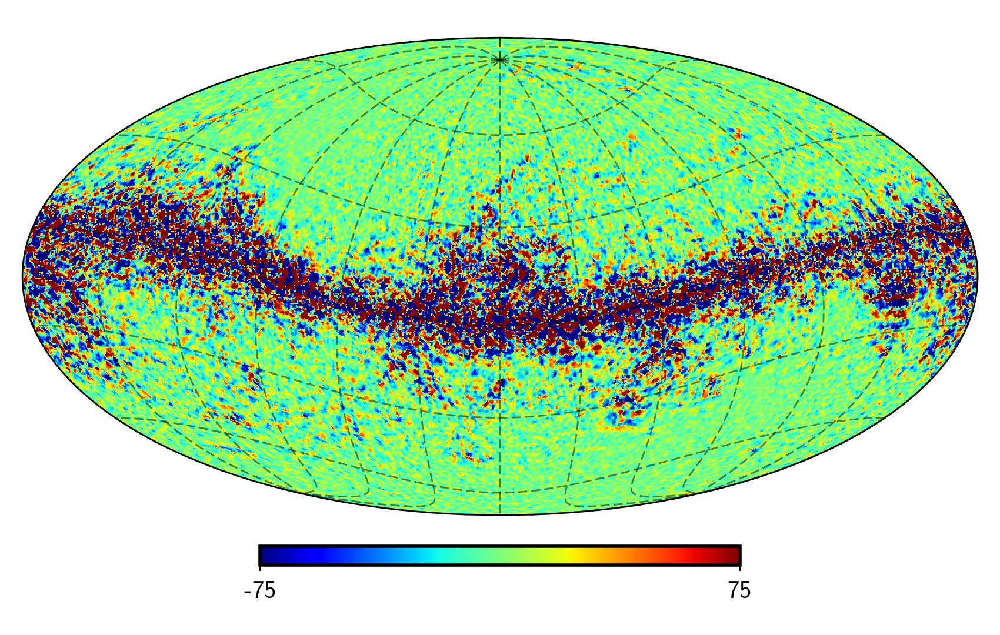

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


<IPython.core.display.Javascript object>


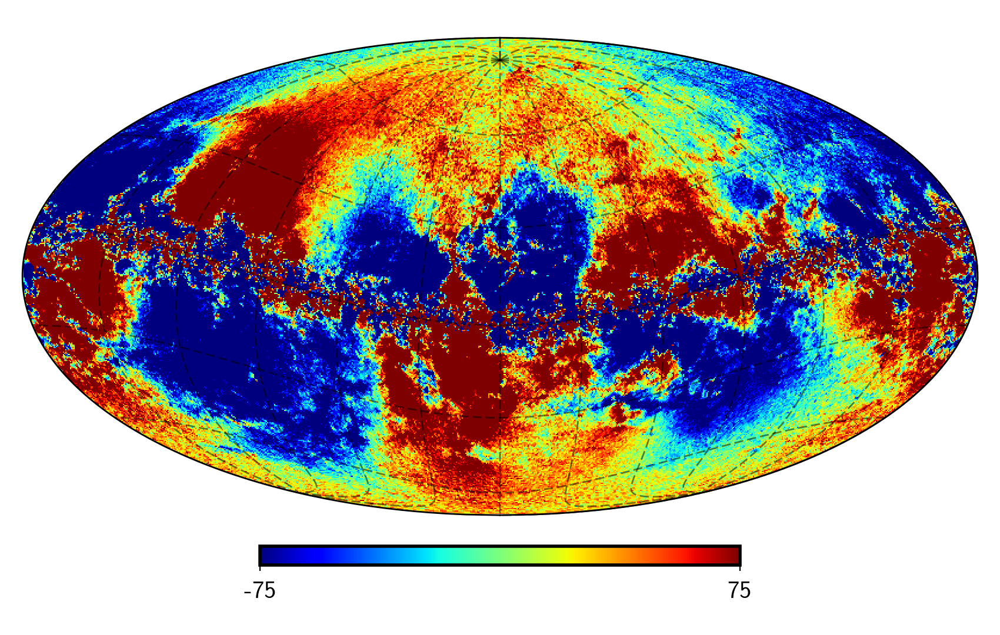

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


<IPython.core.display.Javascript object>


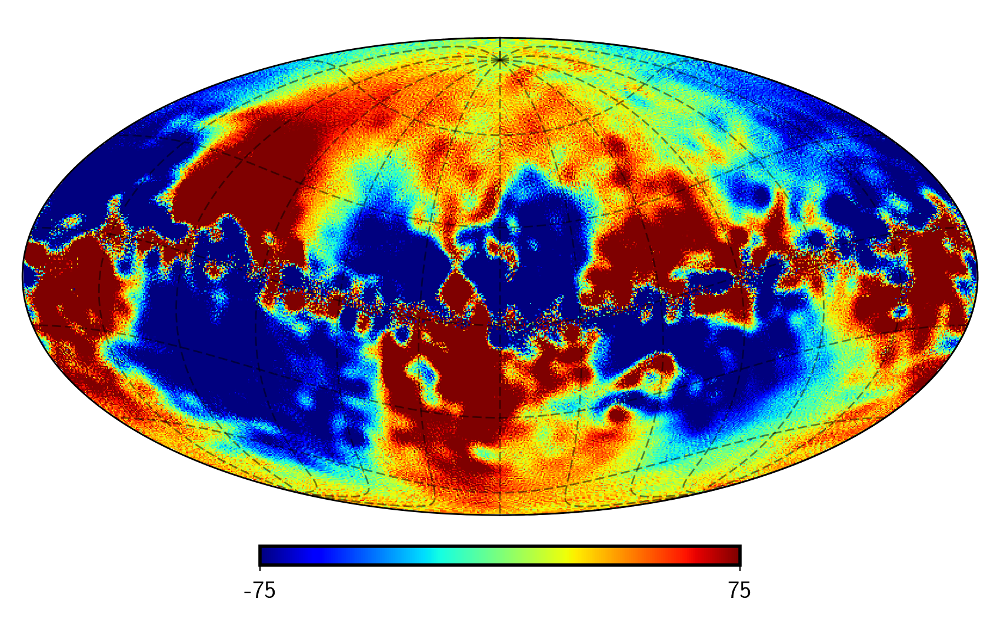

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


<IPython.core.display.Javascript object>


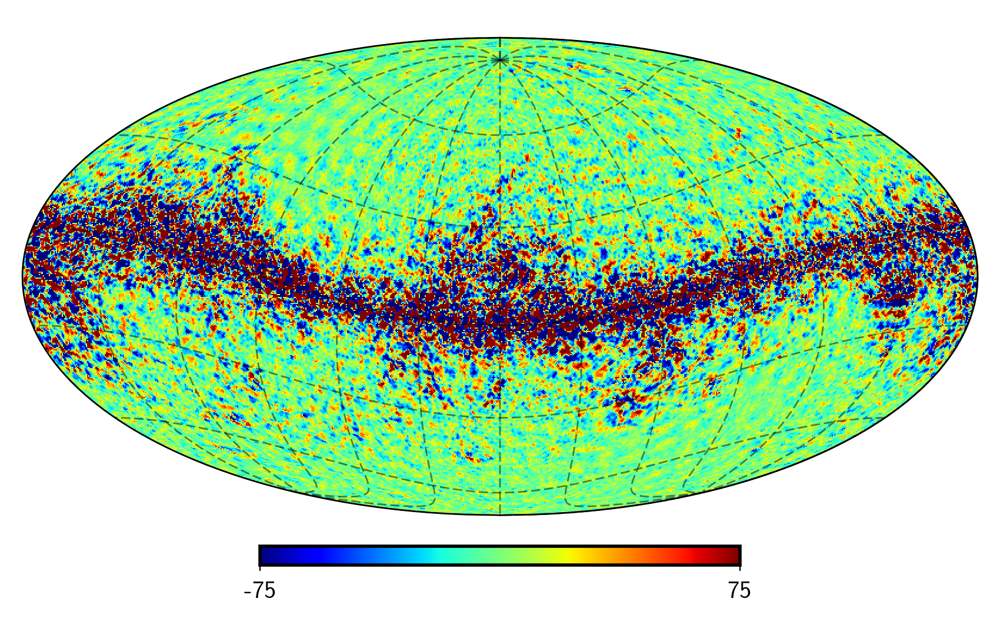

0.0 180.0 -180.0 180.0
The interval between parallels is 30 deg -0.00'.
The interval between meridians is 30 deg -0.00'.


In [71]:
vmin=-75 ; vmax=75
h.mollview(rteb[2],rot=(0,15),min=vmin,max=vmax,title="",cmap=cmap)
h.graticule(linestyle="dashed",alpha=0.5)
filename="353ghz-b-mode-realspace" + suffix + figext
savefig(figpath+filename,dpi=300,bbox_inches="tight")
filename="353ghz-b-mode-realspace" + suffix + ".jpg"
savefig(figpath+filename,dpi=300,bbox_inches="tight")

h.mollview(teb[2],rot=(0,15),min=vmin,max=vmax,title="",cmap=cmap)
h.graticule(linestyle="dashed",alpha=0.5)
filename="353ghz-b-mode-healpix_nofilter.pdf"
savefig(figpath + filename,dpi=300,bbox_inches="tight")

h.mollview((teb[2]-rteb[2]),rot=(0,15),title="",min=vmin,max=vmax,cmap=cmap)
h.graticule(linestyle="dashed",alpha=0.5)
savefig(figpath + "353ghz-b-mode-diff.pdf",dpi=300,bbox_inches="tight")

h.mollview(tebp[2],rot=(0,15),min=vmin,max=vmax,title="",cmap=cmap)
h.graticule(linestyle="dashed",alpha=0.5)
filename="353ghz-b-mode-healpix_filter"+suffix1+".pdf"
savefig(figpath + filename,dpi=300,bbox_inches="tight")

# Spectral analysis

In [72]:
diff=[rteb[0]-teb[0],rteb[1]-teb[1],rteb[2]-teb[2]]
cltebp=h.alm2cl(h.map2alm(tebp,lmax=3*nside,pol=False))
clteb=h.alm2cl(h.map2alm(teb,lmax=3*nside,pol=False))
clrteb=h.alm2cl(h.map2alm(rteb,lmax=3*nside,pol=False))
cldiff=h.alm2cl(h.map2alm(diff,lmax=3*nside,pol=False))

<IPython.core.display.Javascript object>


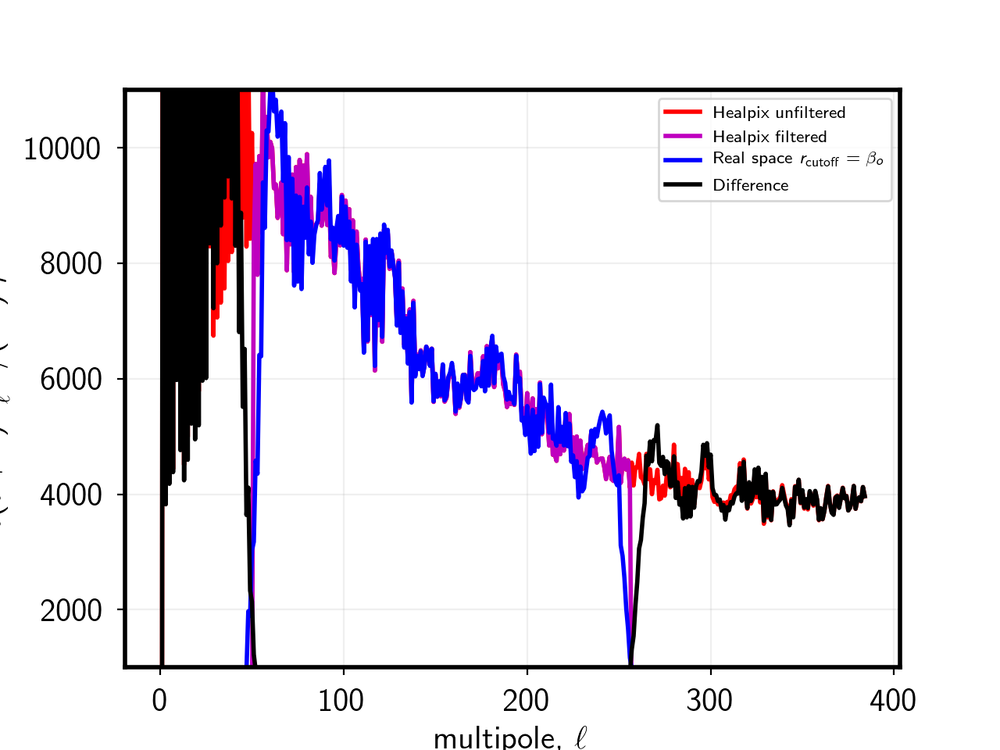

<IPython.core.display.Javascript object>


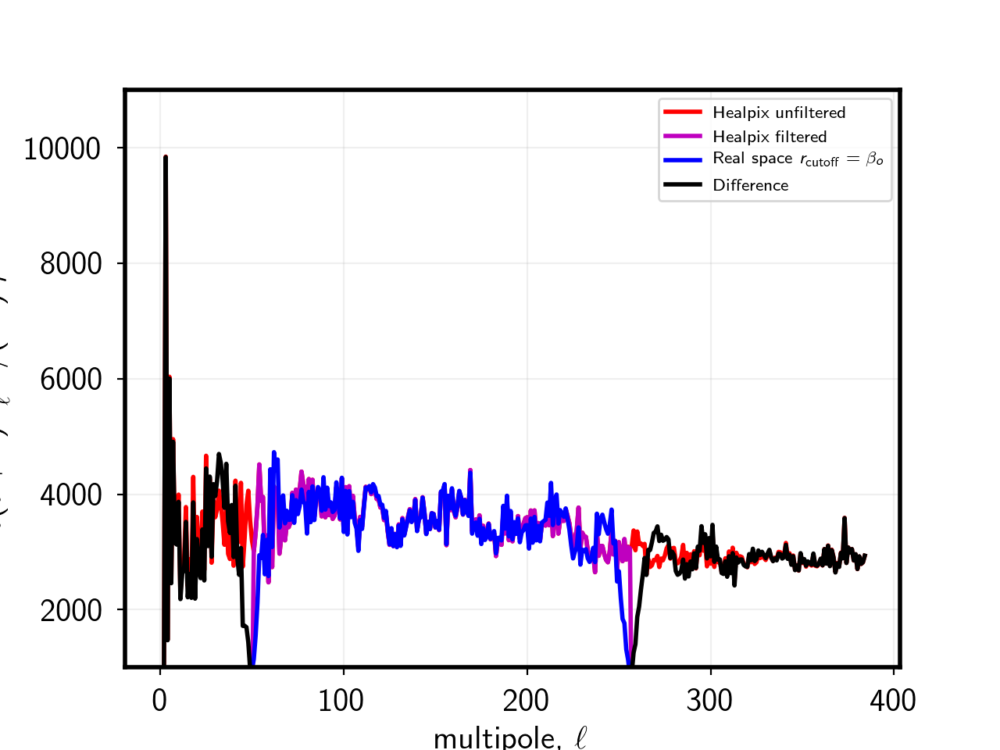

In [73]:
fll=ell*(ell+1)/(2.*pi)
figure()
plot(ell,fll*clteb[1],"r-",label="Healpix unfiltered")
plot(ell,fll*cltebp[1],"m-",label="Healpix filtered")
plot(ell,fll*clrteb[1],"b-",label=r"Real space $r_{\rm cutoff} = \beta_o$")
plot(ell,fll*cldiff[1],"k-",label="Difference")
ylim(1e3,11000)
xlabel(r"multipole, $\ell$")
ylabel(r"$\ell(\ell+1)C^{EE}_{\ell}/(2 \pi)~\mu K^2$")
legend(loc=0,fontsize=8)
#semilogy()
grid(alpha=0.2,linestyle="solid")
filename="clee-353ghz" + suffix + figext
savefig(figpath+filename,dpi=300,bbox_inches="tight")

figure()
plot(ell,fll*clteb[2],"r-",label="Healpix unfiltered")
plot(ell,fll*cltebp[2],"m-",label="Healpix filtered")
plot(ell,fll*clrteb[2],"b-",label=r"Real space $r_{\rm cutoff} = \beta_o$")
plot(ell,fll*cldiff[2],"k-",label="Difference")
ylim(1e3,11000)
xlabel(r"multipole, $\ell$")
ylabel(r"$\ell(\ell+1)C^{BB}_{\ell}/(2 \pi)~\mu K^2$")
legend(loc=0,fontsize=8)
#semilogy()
grid(alpha=0.2,linestyle="solid")
filename="clbb-353ghz" + suffix + figext
savefig(figpath+filename,dpi=300,bbox_inches="tight")

<IPython.core.display.Javascript object>


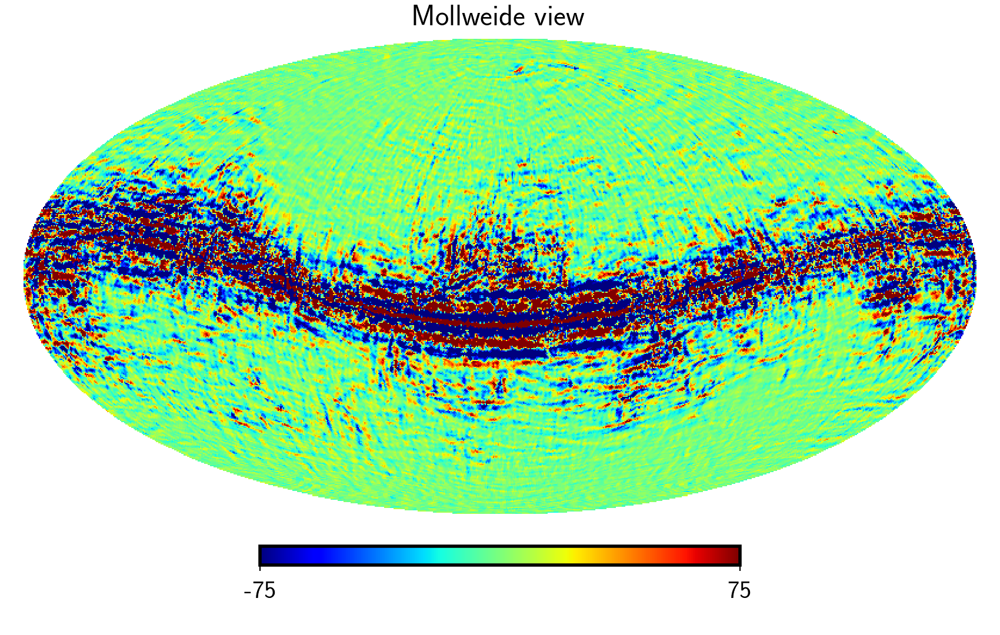

<IPython.core.display.Javascript object>


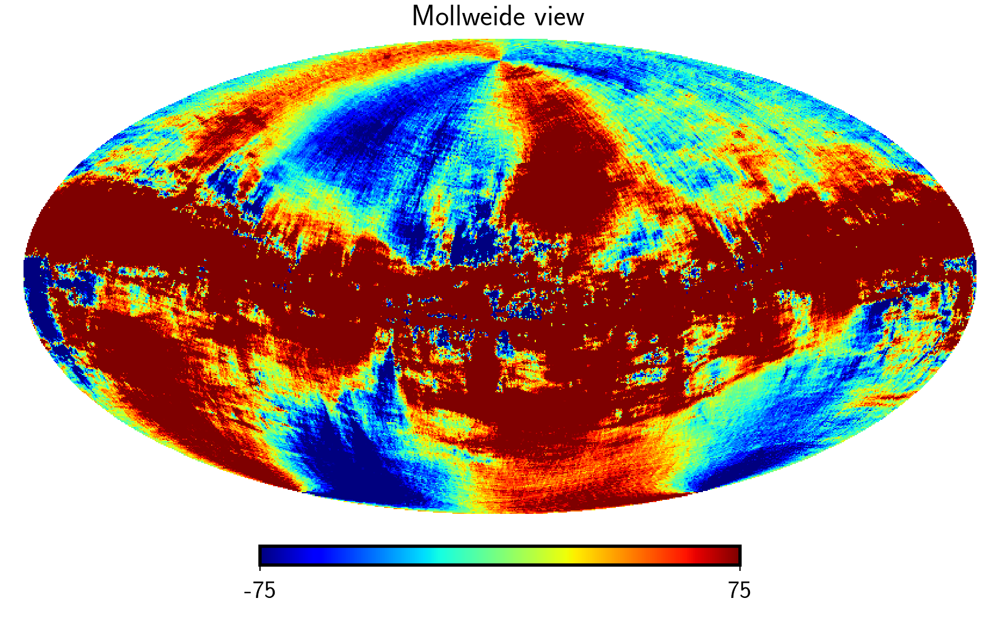

<IPython.core.display.Javascript object>


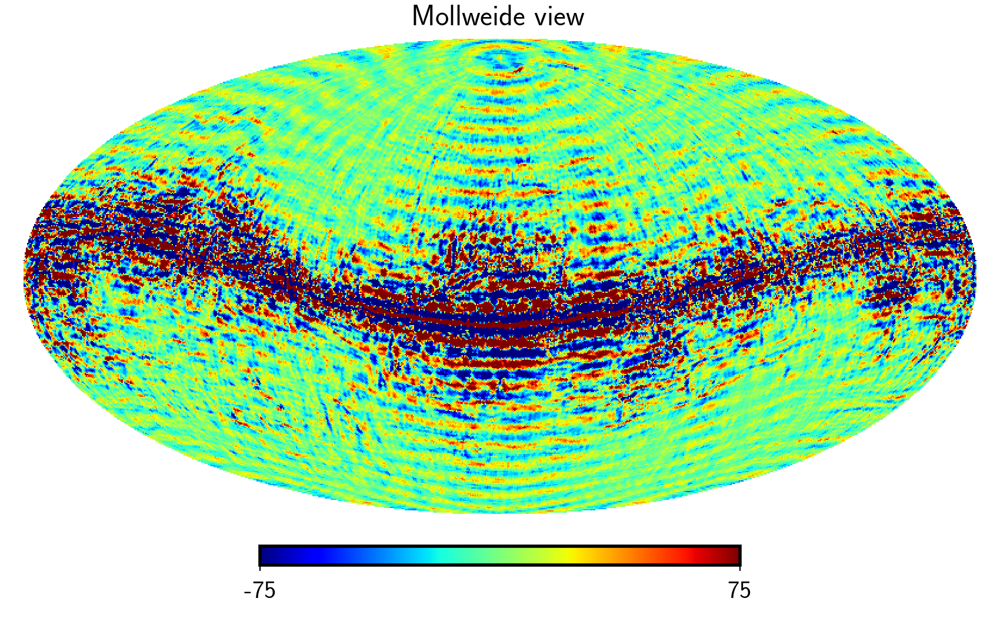

In [74]:
vmin=-75 ; vmax=75
h.mollview(requ[1],min=vmin,max=vmax,rot=(0,15))
h.mollview(equ[1],min=vmin,max=vmax,rot=(0,15))
h.mollview(equp[1],min=vmin,max=vmax,rot=(0,15))

<IPython.core.display.Javascript object>


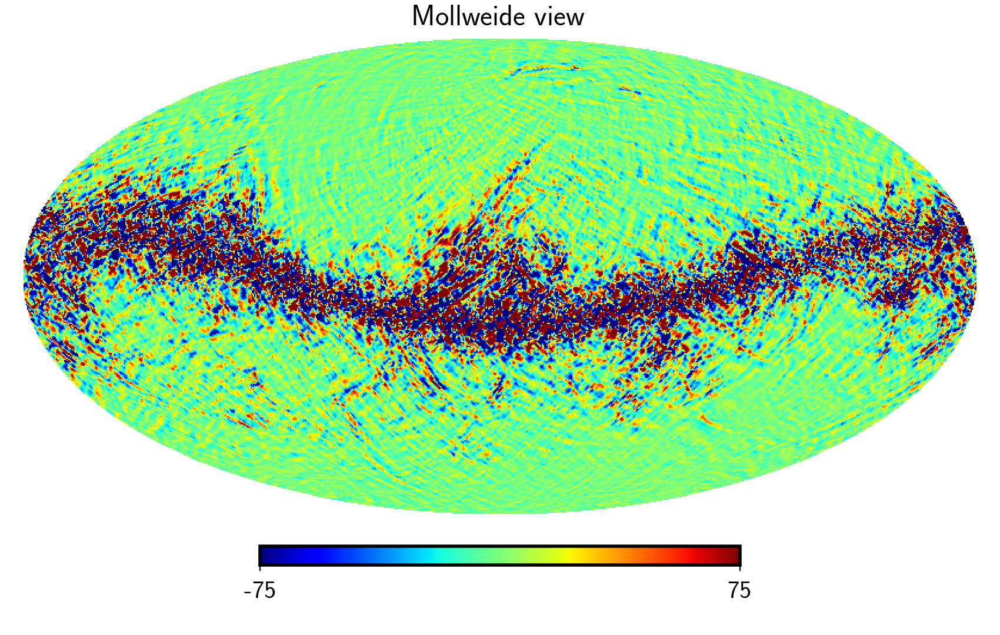

<IPython.core.display.Javascript object>


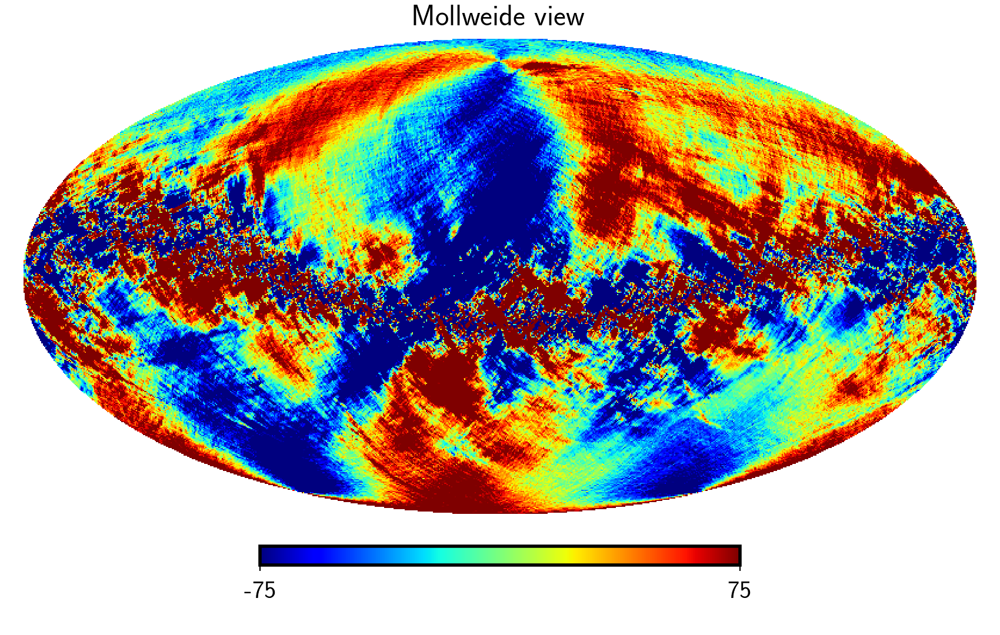

<IPython.core.display.Javascript object>


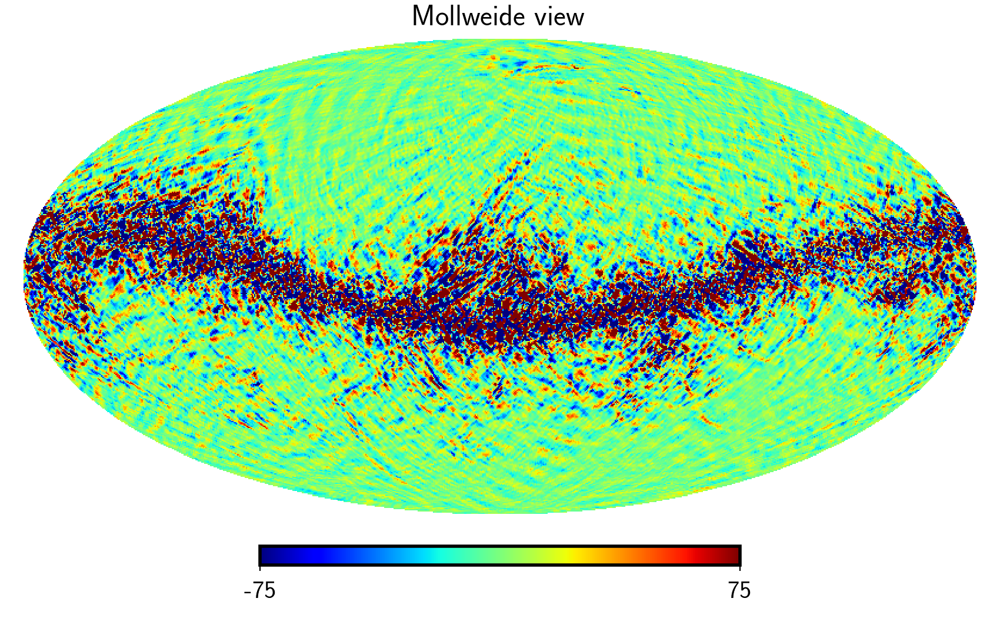

In [75]:
vmin=-75 ; vmax=75
h.mollview(requ[2],min=vmin,max=vmax,rot=(0,15))
h.mollview(equ[2],min=vmin,max=vmax,rot=(0,15))
h.mollview(equp[2],min=vmin,max=vmax,rot=(0,15))

<IPython.core.display.Javascript object>


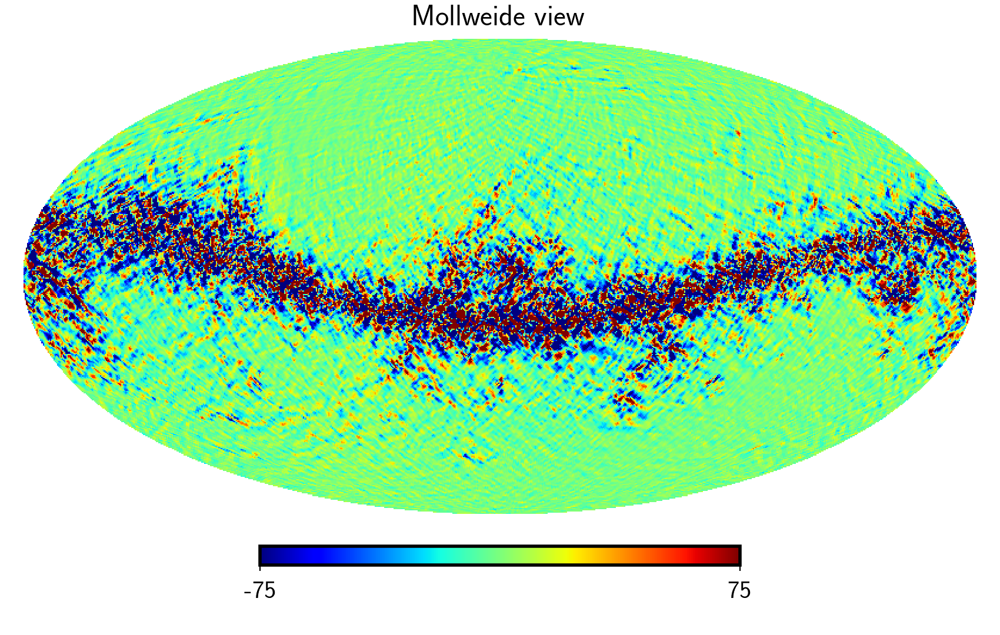

<IPython.core.display.Javascript object>


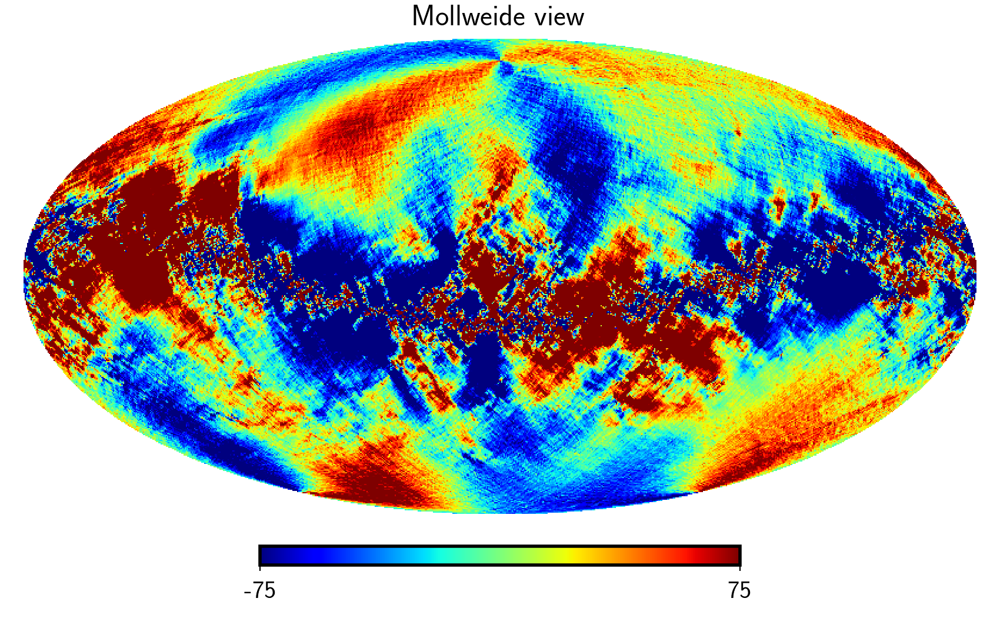

<IPython.core.display.Javascript object>


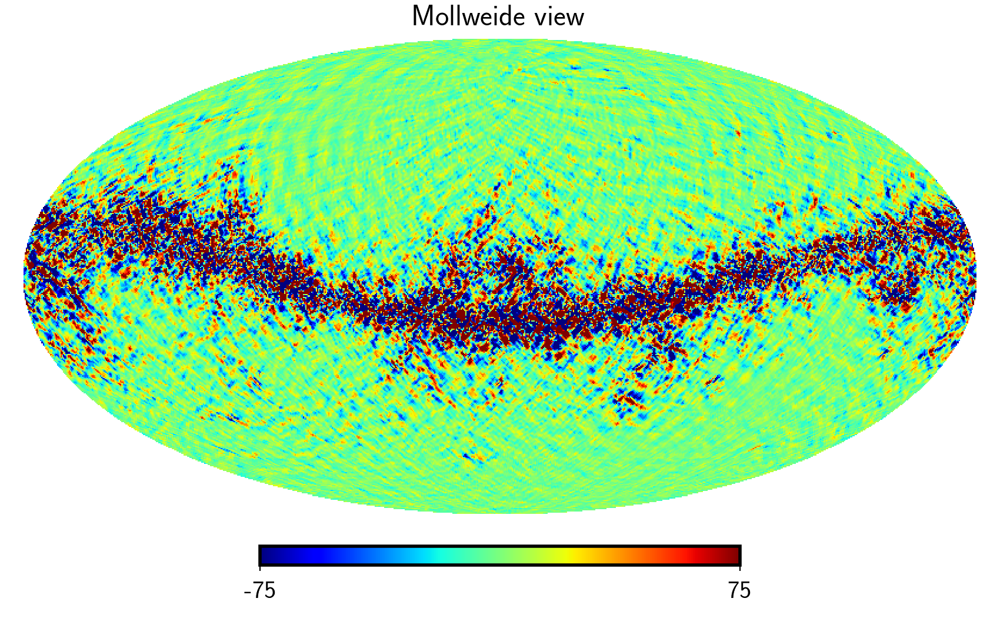

In [76]:
vmin=-75 ; vmax=75
h.mollview(rbqu[1],min=vmin,max=vmax,rot=(0,15))
h.mollview(bqu[1],min=vmin,max=vmax,rot=(0,15))
h.mollview(bqup[1],min=vmin,max=vmax,rot=(0,15))

<IPython.core.display.Javascript object>


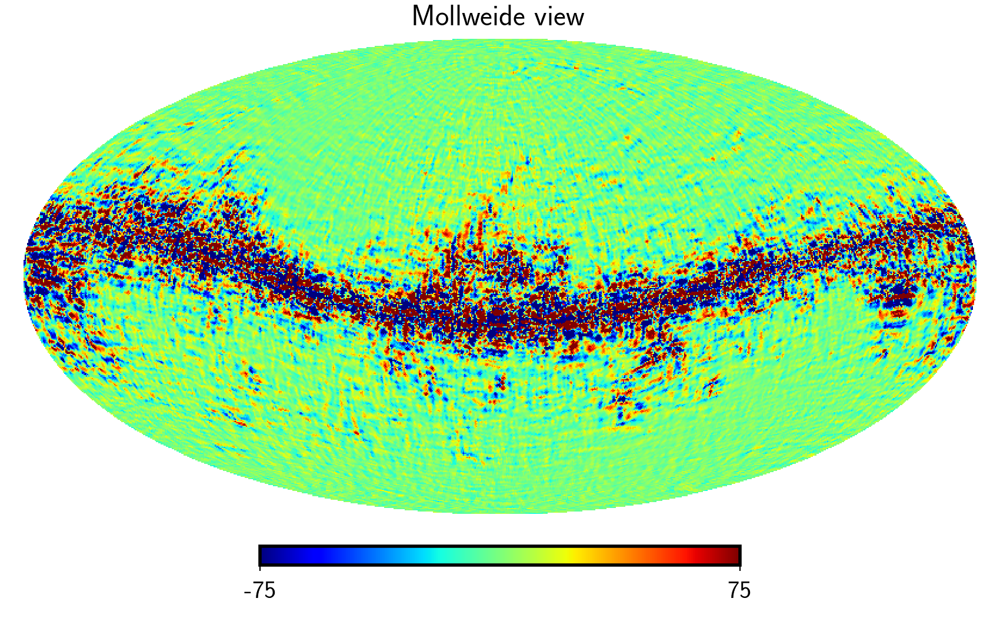

<IPython.core.display.Javascript object>


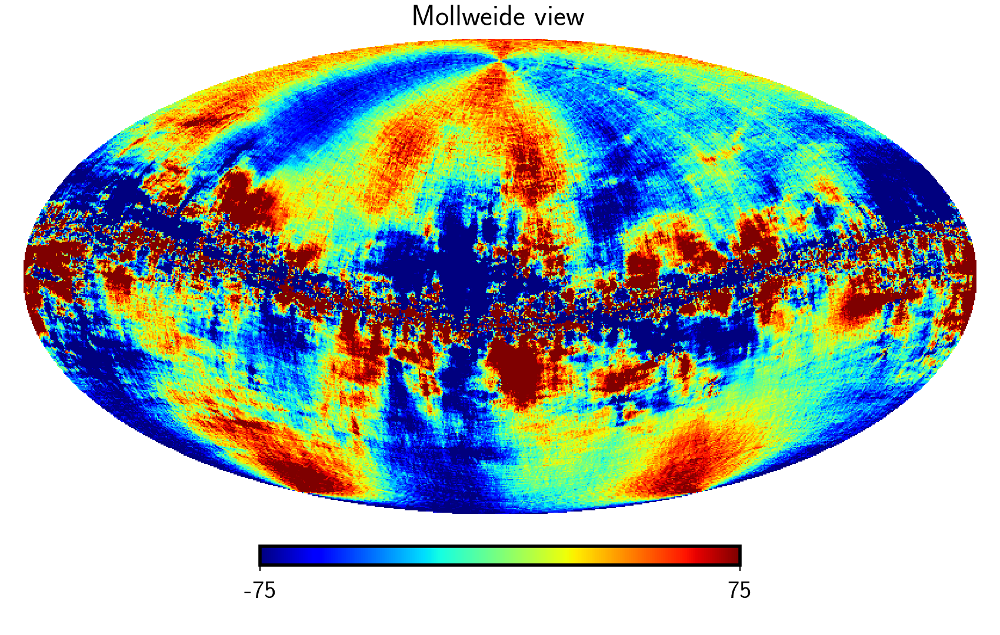

<IPython.core.display.Javascript object>


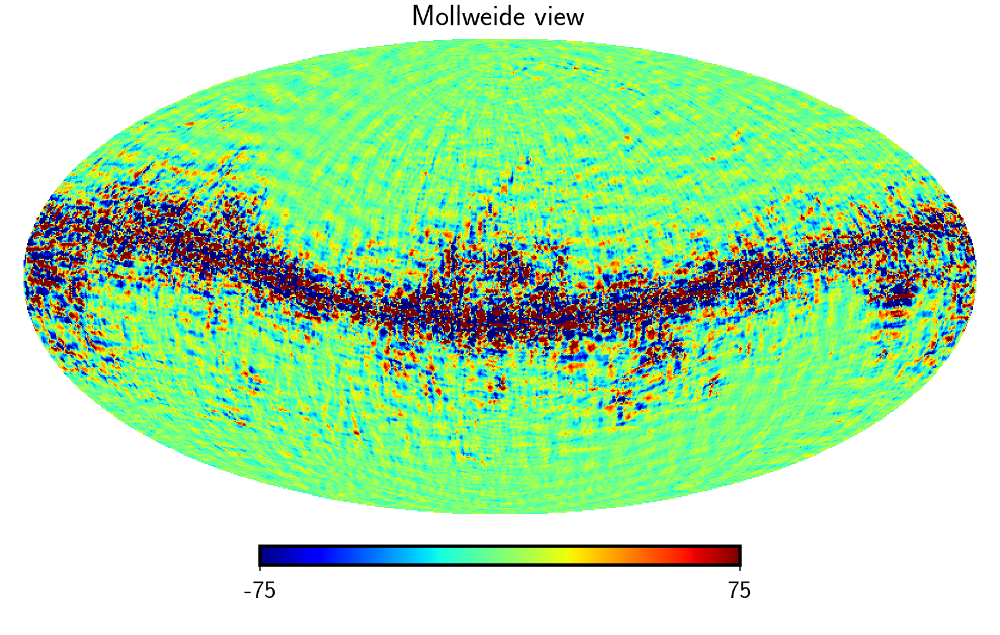

In [77]:
vmin=-75 ; vmax=75
h.mollview(rbqu[2],min=vmin,max=vmax,rot=(0,15))
h.mollview(bqu[2],min=vmin,max=vmax,rot=(0,15))
h.mollview(bqup[2],min=vmin,max=vmax,rot=(0,15))